# Nearest neighbor/retrieval ranking visualization

In [1]:
import sys
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from models.resnet import InsResNet50
from models.LinearModel import LinearClassifierResNet
import os
from torchvision import datasets
from dataset import ImageFolderInstance
from quickdataset import QuickImageFolder
import random

sys.path.append('/afs/csail.mit.edu/u/y/yyou/sidedata/notebooks/yyou/CMC/')
sys.path.append('/afs/csail.mit.edu/u/y/yyou/sidedata/')

In [2]:
epoch = 140

folder_path = "/data/vision/torralba/ganprojects/yyou/CMC/imagenet100_models"
model_name = "/MoCo0.999_softmax_16384_resnet50_lr_0.03_decay_0.0001_bsz_128_crop_0.2_aug_CJ"
epoch_name = "/ckpt_epoch_{}.pth".format(epoch)
my_path = folder_path + model_name + epoch_name
train_folder = "/data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/train"
val_folder = "/data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/val"

In [3]:
from netdissect import renormalize, show
from quickdataset import QuickImageFolder
from dataset import ImageFolderInstance

crop = 0.2
batch_size = 30
num_workers = 24
train_sampler = None
moco = True
gpu = 0
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

image_size = 224
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=mean, std=std)

### Load and View Train Images

In [4]:
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(image_size, scale=(crop, 1.)),
    transforms.RandomGrayscale(p=0.2),
    transforms.ColorJitter(0.4, 0.4, 0.4, 0.4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    normalize,
])

og_transform = transforms.Compose([
    transforms.RandomResizedCrop(image_size, scale=(crop, 1.)),
    transforms.ToTensor(),
    normalize,
])

train_dataset = QuickImageFolder(train_folder, transform=train_transform, two_crop=moco)
train_loader = torch.utils.data.DataLoader(
        train_dataset, batch_size=batch_size, shuffle=(train_sampler is None),
        num_workers=num_workers, pin_memory=True, sampler=train_sampler)

og_dataset = QuickImageFolder(train_folder, transform=og_transform, two_crop=moco)
og_loader = torch.utils.data.DataLoader(
        og_dataset, batch_size=batch_size, shuffle=(train_sampler is None),
        num_workers=num_workers, pin_memory=True, sampler=train_sampler)

Making fast dataset ...  /data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/train
Walking image files ... 



Making fast dataset ...  /data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/train
Walking image files ... 


In [ ]:
def get_batch(train_loader, gpu=0):
    inputs = next(iter(train_loader))
    x1, x2 = torch.split(inputs[0], [3, 3], dim=1)
    return x1, x2

x1, x2 = get_batch(train_loader)
x1_og, x2_og = get_batch(og_loader)

In [ ]:
show([[[renormalize.as_image(img1.to(device), source='imagenet')],
       [renormalize.as_image(img2.to(device), source='imagenet')]] for img1, img2 in zip(x1, x2)])

In [ ]:
show([[[renormalize.as_image(img1.to(device), source='imagenet')],
       [renormalize.as_image(img2.to(device), source='imagenet')]] for img1, img2 in zip(x1_og, x2_og)])

### Load and View Val Images / Feature = Model(inpt)

In [12]:
batch_size = 30
num_workers = 24
image_size = 224
crop_padding = 32

val_transform = transforms.Compose([
                    transforms.Resize(image_size + crop_padding),
                    transforms.CenterCrop(image_size),
                    transforms.ToTensor(),
                    normalize,
                ])

val_dataset = QuickImageFolder(val_folder, transform=val_transform, two_crop=moco)

Making fast dataset ...  /data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/val
Walking image files ... 


In [13]:
val_loader = torch.utils.data.DataLoader(
                val_dataset, batch_size=batch_size, 
                shuffle=False, num_workers=num_workers, pin_memory=True)


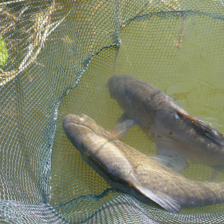
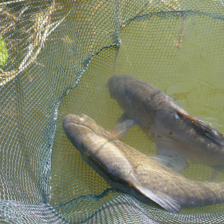
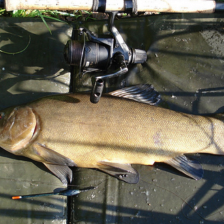
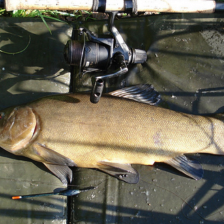
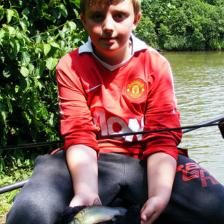
...
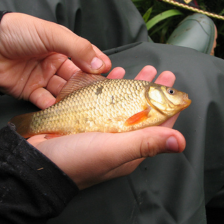
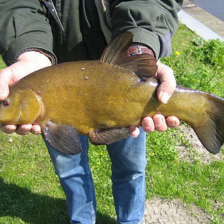
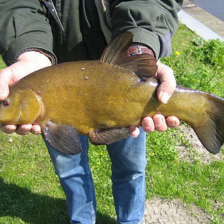
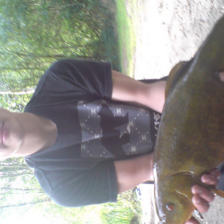
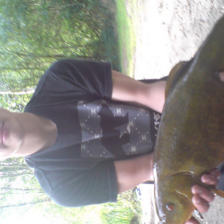

In [33]:
inputs = next(iter(val_loader))
x1, x2 = torch.split(inputs[0], [3, 3], dim=1)
labels = inputs[1]

show([[[renormalize.as_image(img1.to(device), source='imagenet')],
       [renormalize.as_image(img2.to(device), source='imagenet')]] for img1, img2 in zip(x1, x2)])

### Load the latest model from the checkpoint

In [4]:
import sys

In [5]:
model = InsResNet50()
model_ema = InsResNet50()
checkpoint = torch.load(my_path)
model.load_state_dict(checkpoint['model'])
model_ema.load_state_dict(checkpoint['model_ema'])
model.cuda()
model_ema.cuda()

InsResNet50(
  (encoder): DataParallel(
    (module): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(

### Let's look at the sizes

In [ ]:
print("model size: ", sys.getsizeof(model))
print("model ema size: ", sys.getsizeof(model_ema))
print("val loader size: ", sys.getsizeof(val_loader))

# Validation Image Set

### Load feature dictionary

In [6]:
import pickle
from PIL import Image

def load_obj(name ):
    print("==> Loading file ... {}".format(name))
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)

pickle_path = "/data/vision/torralba/ganprojects/yyou/CMC/pkl"
path_to_feat = pickle_path + "/val_to_feat_epch{}".format(epoch)
path_to_label = pickle_path + "/val_to_label_epch{}".format(epoch)
#path_to_img = pickle_path + "/val_to_img_epch{}".format(epoch)

dval_feat = load_obj(path_to_feat)
dval_label = load_obj(path_to_label)
#dval_img = load_obj(path_to_img)

==> Loading file ... /data/vision/torralba/ganprojects/yyou/CMC/pkl/val_to_feat_epch140
==> Loading file ... /data/vision/torralba/ganprojects/yyou/CMC/pkl/val_to_label_epch140


### Helper Images

In [91]:
def split_img(img):
    x1, x2 = torch.split(img, [3, 3], dim=0)
    return x1

def show_idx(idxlist, source='imagenet'):
    if len(idxlist)==1:
        print("image", idxlist[0])
        show(renormalize.as_image(split_img(val_dataset[idxlist[0]][0]), source=source))
    else:
        print("idx list", idxlist)
        show([[renormalize.as_image(split_img(val_dataset[idx][0]), source=source)] for idx in idxlist])

## For image in validation set, what is the most "similar" images within the validation set?

In [8]:
wednesday_path = "/data/vision/torralba/scratch/yyou/wednesday/nearest_neighbors"

In [93]:
def get_nearest_neighbor(query_idx, feature_dict, label_dict, dataset, n=100):
    neighbors = {}
    q_feat = feature_dict[query_idx]
    for idx, feat in feature_dict.items():
        neighbors[idx] = np.dot(feat, q_feat)
    neighbors = sorted(neighbors.items(), key=lambda x:x[1], reverse=True)
    nearest_img = [split_img(dataset[idx][0]) for idx, score in neighbors[:n]]   
    nearest_score = [(score, label_dict[idx]) for idx, score in neighbors[:n]]
    return nearest_img, nearest_score
    
def imsave(imlist, fname, source='imagenet', blocks=5):
    if len(imlist)==1:
        renormalize.as_image(imlist[0], source=source).save(fname, format='png')
    else:
        im1 = renormalize.as_image(imlist[0], source=source)
        w, h = im1.width, im1.height
        num_vert = len(imlist) // blocks + 1
        dst = Image.new('RGB', (w*blocks, h*num_vert))
        for i, img in enumerate(imlist):
            dst.paste(renormalize.as_image(img, source=source),\
                      ((i%blocks)*w, (i//blocks)*h))
        dst.save(fname, format='png')


In [43]:
import random

n=200
for i in range(95):
    q_idx = random.randint(0,len(val_dataset)-1)
    nearest_img, nearest_score = get_nearest_neighbor(q_idx, dval_feat, dval_label, val_dataset, n)
    query_img = split_img(val_dataset[q_idx][0])
    #imsave([query_img], wednesday_path+"/query{}".format(q_idx))
    imsave(nearest_img, wednesday_path+"/query{}_neighbors_{}".format(q_idx, n))

KeyboardInterrupt: 

## What are the distribution of differences like?

In [47]:
def get_nearest_neighbor_idx(query_idx, feature_dict, n=100):
    neighbors = {}
    q_feat = feature_dict[query_idx]
    for idx, feat in feature_dict.items():
        neighbors[idx] = np.dot(feat, q_feat)
    neighbors = sorted(neighbors.items(), key=lambda x:x[1], reverse=True)
    return neighbors[:n]
  
def quick_all_distance_distribution(feature_dict, dataset):
    fig, axs = plt.subplots(2, 2, figsize=(12,8))
    axs = axs.flatten()
    dist20, dist100, dist500, distAll = [],[],[],[]
    
    for i in range(100):
        query = random.randint(0,len(val_dataset)-1)
        neighbors = get_nearest_neighbor_idx(query, feature_dict, n=len(feature_dict))
        neighbors = [dist for i,dist in neighbors if i!=query]
        dist20.extend(neighbors[:20])
        dist100.extend(neighbors[:100])
        dist500.extend(neighbors[:500])
        distAll.extend(neighbors)
    dists = [dist20, dist100, dist500, distAll]
    for i, n in enumerate([20, 100, 500, len(feature_dict)]):
        axs[i].hist(dists[i], bins=25)
        axs[i].set_title('nearest {}'.format(n))
    fig.suptitle("all")

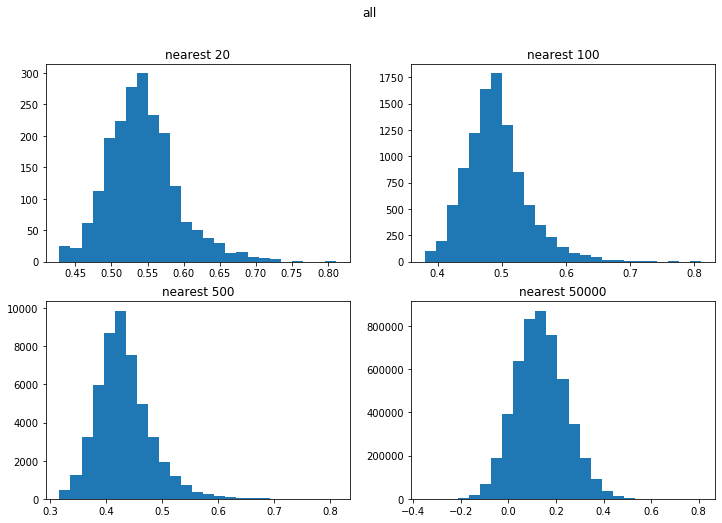

In [41]:
quick_all_distance_distribution(dval_feat, val_dataset)

In [48]:
def distance_distribution_for_id(query, feature_dict, dataset):
    fig, axs = plt.subplots(2, 2, figsize=(12,8))
    axs = axs.flatten()
    
    for i, n in enumerate([20, 100, 500, len(feature_dict)]):
        neighbors = get_nearest_neighbor(query, feature_dict, n=n)
        distances = [dist for i,dist in neighbors if i!=query]
        axs[i].hist(distances, bins=15)
        axs[i].set_title('nearest {}'.format(n))
    fig.suptitle("q_idx {}".format(query))

In [49]:
def high_dot_product_neighbors(feature_dict, dataset, f=lambda x:x<0.45, n=10, howmany=5):
    found = False
    indices = []
    neighbor_list = []
    while not found:
        query = random.randint(0,len(val_dataset)-1)
        neighbors = get_nearest_neighbor_idx(query, feature_dict, n=n)
        distances = np.array([dist for i,dist in neighbors if i!=query])
        neighbor_list.append(np.array([i for i,dist in neighbors if i!=query]))
        avg = np.mean(distances)
        if f(avg):
            indices.append(query)
        if len(indices) == howmany:
            return indices, neighbor_list

In [94]:
n = 10
indices, nearest = high_dot_product_neighbors(dval_feat, val_dataset, f= lambda x:x<0.48, n=10)

NameError: name 'q_idx' is not defined

In [97]:
for idx, nbhr in zip(indices, nearest):
    imsave([val_dataset[j] for j in [idx]+list(nbhr)], wednesday_path+"/query{}_wost_neighbors_{}".format(idx, n))

AttributeError: 'tuple' object has no attribute 'shape'

In [ ]:

def worst_distribution(feature_dict, dataset):
    found = True
    for _ in range(50):
        query = random.randint(0,len(val_dataset)-1)
        fig, axs = plt.subplots(2, 2, figsize=(12,8))
        axs = axs.flatten()
        for i, n in enumerate([20, 100, 500, len(feature_dict)]):
            neighbors = get_nearest_neighbor(query, feature_dict, n=n)
            distances = [dist for i,dist in neighbors if i!=query]
            axs[i].hist(distances, bins=15)
            axs[i].set_title('nearest {}'.format(n))
            if len([dist for dist in distances if dist<0.3])>0.2*n:
                found = True
        if found:
            fig.suptitle("q_idx {}".format(query))
            return query
    
    
def worst_distribution(feature_dict, dataset):
    fig, axs = plt.subplots(2, 2, figsize=(12,8))
    axs = axs.flatten()
    dist20, dist100, dist500, distAll = [],[],[],[]
    
    for i in range(100):
        query = random.randint(0,len(val_dataset)-1)
        neighbors = get_nearest_neighbor(query, feature_dict, n=len(feature_dict))
        neighbors = [dist for i,dist in neighbors]
        dist20.extend(neighbors[:20])
        dist100.extend(neighbors[:100])
        dist500.extend(neighbors[:500])
        distAll.extend(neighbors)
    dists = [dist20, dist100, dist500, distAll]
    for i, n in enumerate([20, 100, 500, len(feature_dict)]):
        axs[i].hist(dists[i], bins=25)
        axs[i].set_title('nearest {}'.format(n))
    fig.suptitle("all")

In [77]:
neighbors = get_nearest_neighbor(1000, dval_feat, n=len(dval_feat))
neighbors = [dist for i,dist in neighbors]
neighbors.sort()
print(neighbors[:10])

[-0.21081412, -0.17875677, -0.17622435, -0.17620513, -0.16669714, -0.16113983, -0.15057379, -0.14650674, -0.14468433, -0.14456461]


q_idx  36200



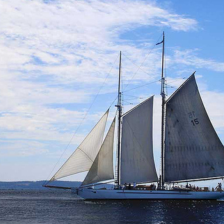

q_idx  33835



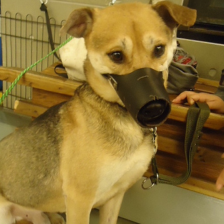

q_idx  27535



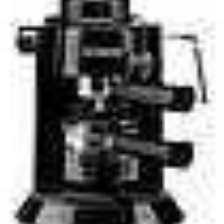

q_idx  44878



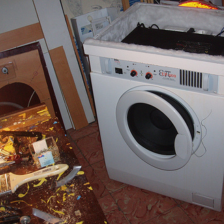

q_idx  42310



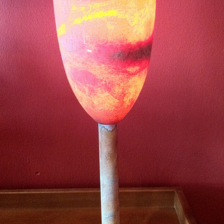

q_idx  39979



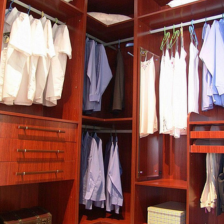

q_idx  7014



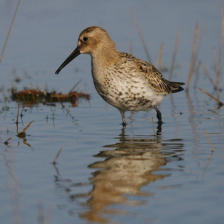

q_idx  23913



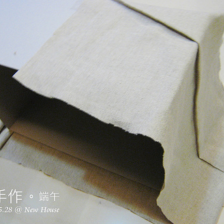

q_idx  16930



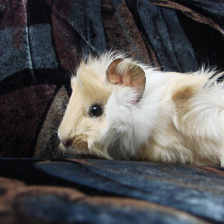

q_idx  49144



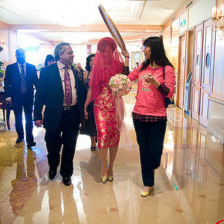

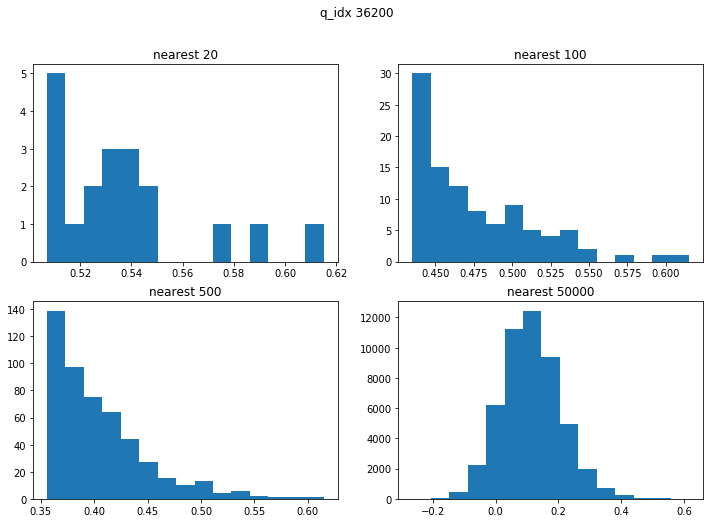

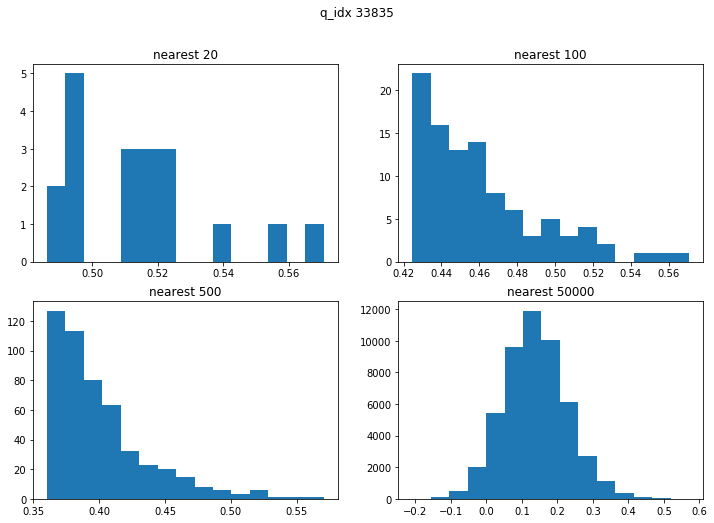

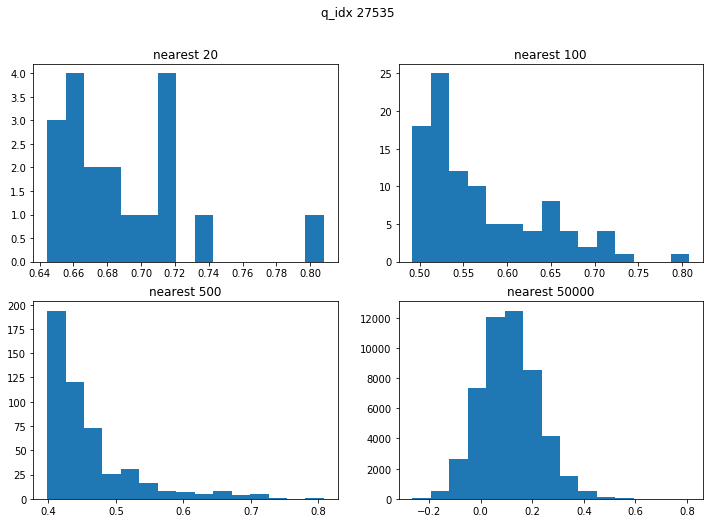

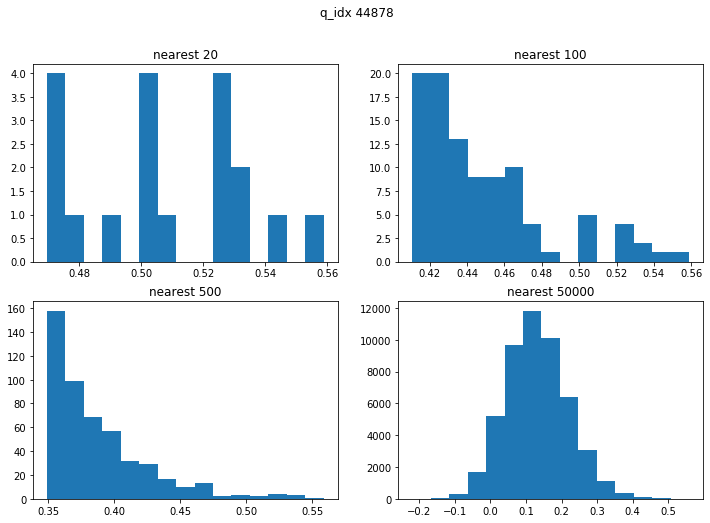

...

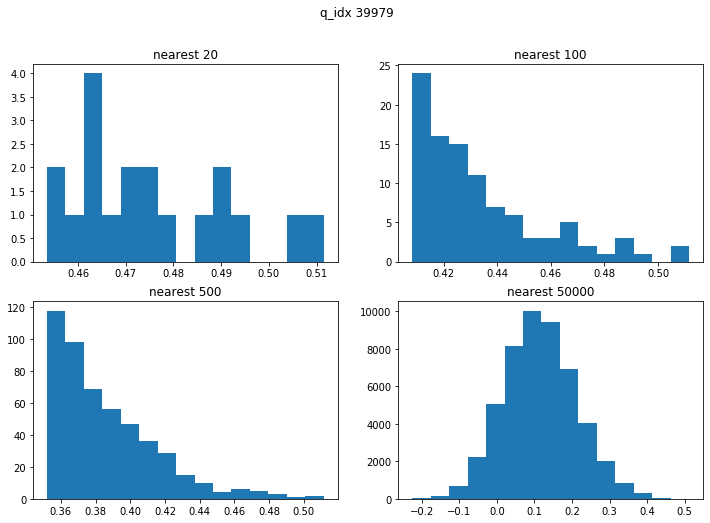

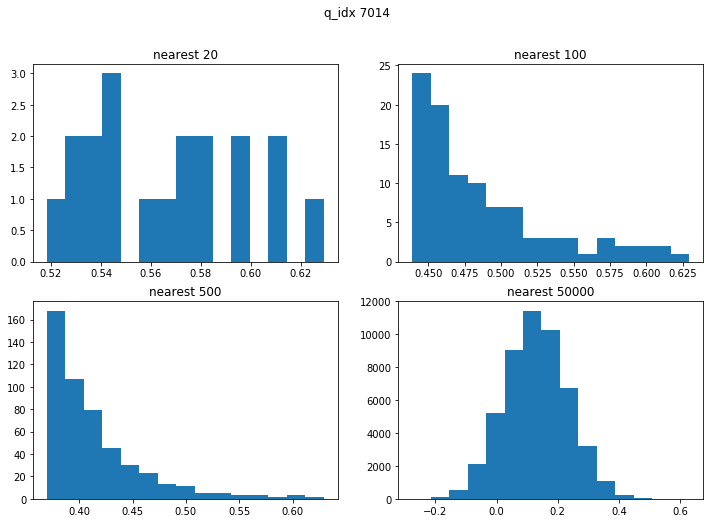

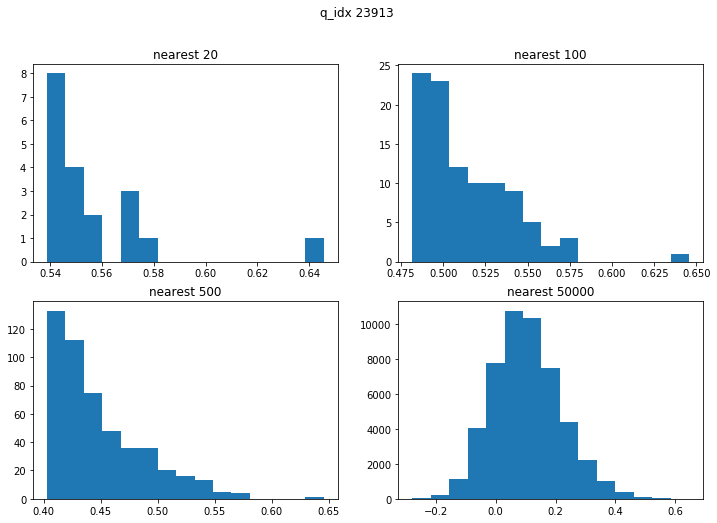

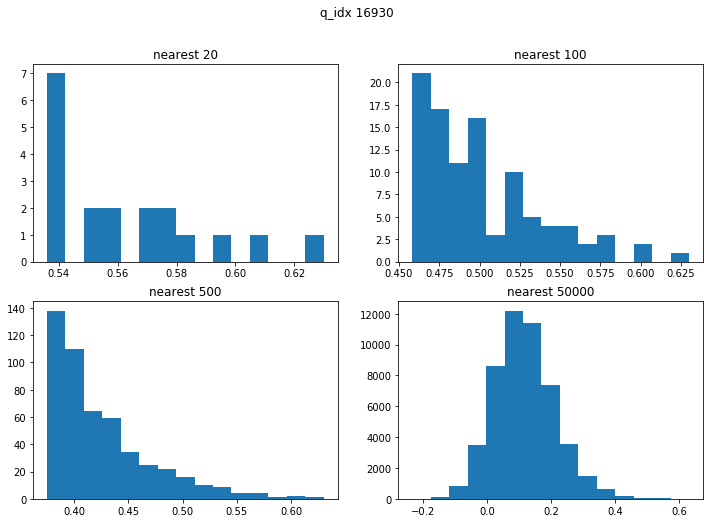

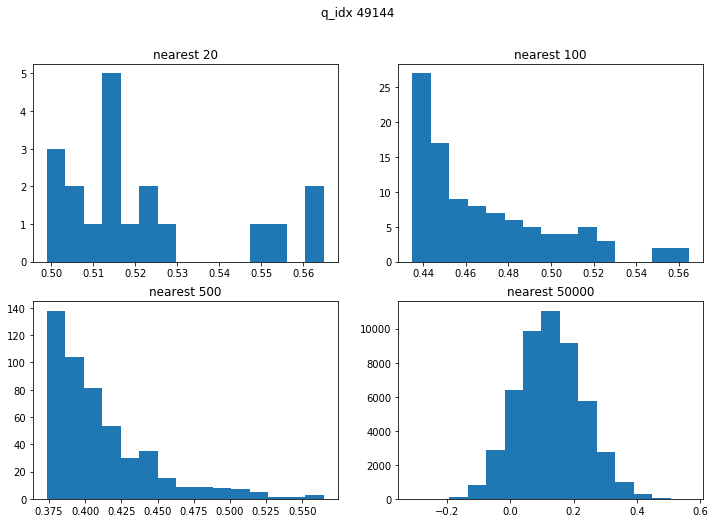

In [64]:
for i in range(10):
    q_idx = random.randint(0,len(val_dataset)-1)
    print("q_idx ", q_idx)
    show_idx([q_idx])
    q_distance_distribution(q_idx, dval_feat, val_dataset)

### top activated features in the validation set with dot products

In [114]:
def get_top_activated_features(query)

In [57]:
def get_nearest_neighbor_labels(query_idx, feature_dict, label_dict, dataset):
    neighbors = {}
    q_feat = feature_dict[query_idx]
    for idx, feat in feature_dict.items():
        neighbors[idx] = (np.dot(feat, q_feat), label_dict[idx])
    neighbors = sorted(neighbors.items(), key=lambda x:x[1], reverse=True)
    return neighbors

In [100]:

def top_labels_count(labels, n=3):
    counts = sorted(labels.items(), key=lambda x:x[1], reverse=True)[:n]
    rep = ''
    for l, c in counts:
        rep += '{} ({}) '.format(l, c)
    return rep

# top activated neighbors, what are their labels
def top_activated_labels(qlabel, neighbors, n=100):
    labels = {}
    for idx, (feat, label) in neighbors[:n]:
        labels[str(label)] = labels.get(str(label), 0) + 1
    rep = top_labels_count(labels, n=3)
    plt.figure(figsize=(10,4))
    plt.bar(labels.keys(), labels.values())
    plt.title("nearest: {}, query: {}, max count: {}".format(n, qlabel, rep))
    return labels

In [103]:
n = 5
q_idx = random.randint(0,len(val_dataset)-1)
nearest_img, nearest_score = get_nearest_neighbor(q_idx, dval_feat, dval_label, val_dataset, n)
query_img = split_img(val_dataset[q_idx][0])
#imsave(nearest_img, wednesday_path+"/query{}_neighbors_{}".format(q_idx, n))

In [112]:
nearest_img

[tensor([[[-2.1008, -2.1008, -2.0665,  ..., -2.0323, -2.0323, -2.0323],
          [-2.0837, -2.0665, -2.0665,  ..., -2.0323, -2.0494, -2.0494],
          [-2.0665, -2.0837, -2.0837,  ..., -2.0494, -2.0494, -2.0494],
          ...,
          [-2.0837, -2.0665, -2.0665,  ..., -1.8610, -1.8610, -1.8610],
          [-2.0665, -2.0665, -2.0665,  ..., -1.8610, -1.8610, -1.8439],
          [-2.0665, -2.0665, -2.0665,  ..., -1.8782, -1.8953, -1.8610]],
 
         [[-2.0182, -2.0182, -1.9832,  ..., -1.9482, -1.9482, -1.9482],
          [-2.0007, -1.9832, -1.9832,  ..., -1.9482, -1.9657, -1.9657],
          [-1.9832, -2.0007, -2.0007,  ..., -1.9657, -1.9657, -1.9657],
          ...,
          [-2.0007, -1.9832, -1.9832,  ..., -1.7731, -1.7731, -1.7556],
          [-1.9832, -1.9832, -1.9832,  ..., -1.7731, -1.7731, -1.7556],
          [-1.9832, -1.9832, -1.9832,  ..., -1.7906, -1.8081, -1.7731]],
 
         [[-1.7870, -1.7870, -1.7522,  ..., -1.7173, -1.7173, -1.7173],
          [-1.7696, -1.7522,


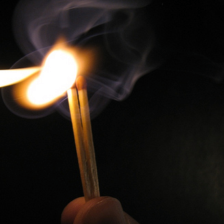

In [108]:
show_idx([q_idx])


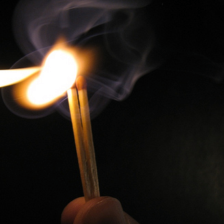
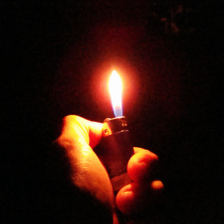
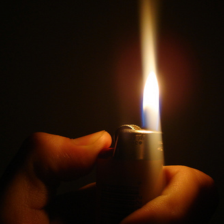
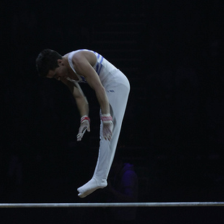
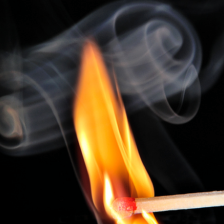

In [111]:
show([renormalize.as_image(img, source='imagenet') for img in nearest_img])

query idx 32938



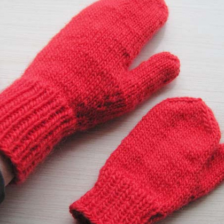

neighbor idx [34459, 22259, 30702, 25096, 35023]



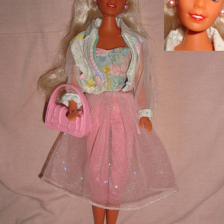
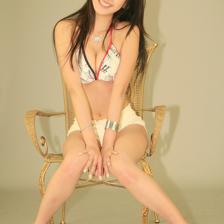
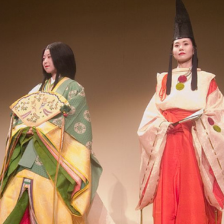
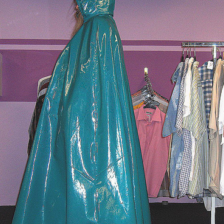
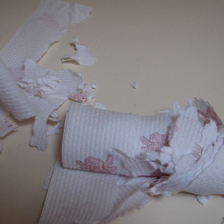

labels:  [689, 445, 614, 501, 700]


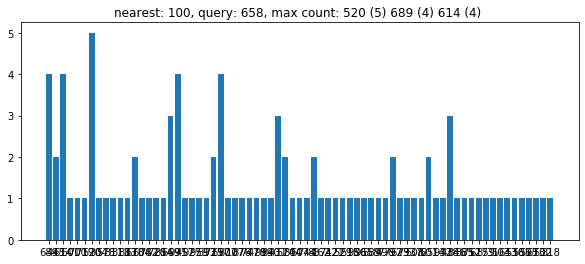

In [101]:
q_idx = random.randint(0,len(val_dataset)-1)
neighbors = get_nearest_neighbor_labels(q_idx, dval_feat, dval_label, val_dataset)
print("query idx", idx)
show_idx([idx])

nidx = [idx for idx, val in neighbors[:5]]
print("neighbor idx", nidx)
show_idx(nidx)

print("labels: ", [val[1] for idx, val in neighbors[:5]])
labels = top_activated_labels(dval_label[idx], neighbors, n=100)

In [102]:
neighbors

[(34459, (0.99999994, 689)),
 (22259, (0.6473988, 445)),
 (30702, (0.5869665, 614)),
 (25096, (0.579947, 501)),
 (35023, (0.57311714, 700)),
 (35975, (0.5660559, 719)),
 (26021, (0.562919, 520)),
 (15219, (0.56049246, 304)),
 (26033, (0.551913, 520)),
 (28900, (0.5392265, 578)),
 (15579, (0.5379108, 311)),
 (15680, (0.53576404, 313)),
 (44197, (0.5349104, 883)),
 (33912, (0.5348009, 678)),
 (34497, (0.53313935, 689)),
 (34450, (0.53295463, 689)),
 (26007, (0.5252595, 520)),
 (34481, (0.5205468, 689)),
 (30240, (0.51969314, 604)),
 (39107, (0.5182377, 782)),
 (36015, (0.5170626, 720)),
 (42701, (0.5163161, 854)),
 (33496, (0.5150701, 669)),
 (49574, (0.5135716, 991)),
 (22857, (0.50978315, 457)),
 (49569, (0.50896484, 991)),
 (46381, (0.5085728, 927)),
 (47950, (0.50677323, 959)),
 (29670, (0.5062213, 593)),
 (36274, (0.50326294, 725)),
 (30749, (0.5025591, 614)),
 (34895, (0.50202346, 697)),
 (33459, (0.50170714, 669)),
 (40398, (0.501172, 807)),
 (5368, (0.4979846, 107)),
 (43823, (0.

In [ ]:

def get_nearest_distr(query_idx, feature_dict, label_dict, dataset, n=100):
    neighbors = {}
    q_feat = feature_dict[query_idx]
    for idx, feat in feature_dict.items():
        neighbors[idx] = np.dot(feat, q_feat)
    return nearest_img, nearest_score
    

In [44]:
dval_feat

{0: array([ 0.02511341,  0.07442034,  0.10288841, -0.04695834,  0.05156805,
        -0.03594197,  0.00071978, -0.01314006,  0.1259104 , -0.0204685 ,
         0.0780743 ,  0.03139101,  0.11887169, -0.13017088, -0.15428934,
        -0.069595  ,  0.17939788,  0.06191555, -0.08626126, -0.07937369,
         0.09784413, -0.01245524, -0.1360807 , -0.00137867, -0.22498561,
         0.10944687,  0.1781997 ,  0.08956023,  0.0562795 , -0.07405871,
        -0.00796081,  0.06302946, -0.09639304,  0.10822096, -0.17551124,
         0.01459108,  0.07389918,  0.09394795,  0.00750285, -0.05740494,
         0.0698605 , -0.08482586, -0.10483748, -0.1984001 , -0.03537472,
         0.10533117, -0.1007735 ,  0.04122176, -0.12905192,  0.07709108,
         0.02239018, -0.06246319, -0.01859596,  0.04208445,  0.08570249,
        -0.06786864,  0.01054339,  0.07882765,  0.09616215,  0.09863979,
         0.03802789, -0.1001397 , -0.06427216, -0.04089353, -0.07026938,
        -0.14447121, -0.09999448, -0.10558604,  

## highest lost image and lowest loss image in terms of contrastive loss

## Key vs Top Activated Images

## Checkpoint translations

### MemoryMoCo (contrast) is a fixed-size queue with momentum encoder